# Lab 8 : Decision Trees


# 1. Load the dataset (X and Y vector)

In [50]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
import pandas as pd
import seaborn as sns 

DATASET_PATH = '../data/Fish_Dataset/Fish_Dataset/'

In [51]:
def get_labels():
    folders = os.listdir(DATASET_PATH)
    labels = []
    for f in folders:
        if not('.m' in f) and not('.txt' in f):
            labels.append(f)
    labels = np.array(labels)
    return labels

def get_X_Y(labels):
    # Get the images for each label
    img_shape = (128, 128) #resizing images to this shape ( after converting color image to gray image)
    n_sample_per_class = 600 #Keep only this number of samples per class (expensive complexity issue)
    nb_img = n_sample_per_class*len(labels) #1000 images per class

    X = np.zeros((nb_img, img_shape[0]*img_shape[1])) # feature matrix
    Y = np.zeros(nb_img) #labels vector
    for i in range(len(labels)):
        folder = os.path.join(DATASET_PATH, labels[i], labels[i])
        images = os.listdir(folder)
        np.random.shuffle(images)
        for j in range(n_sample_per_class):
            img_path = os.path.join(folder, images[j])
            img = cv2.imread(img_path, 0) #Load the gray image
            #Resizing
            img = cv2.resize(src=img, dsize=img_shape)
            #Normalization
            img = img/255
            #Add the image in the feature matrix and its labels to the label vector
            X[i*n_sample_per_class+j, :] = img.flatten()
            Y[i*n_sample_per_class+j] = np.argwhere(labels==labels[i])[0]
    return X, Y

labels = get_labels()
X, Y = get_X_Y(labels)
print("Feature matrix : \n", X)
print("Label vector : \n", Y)

pca = PCA(n_components=50)
pca.fit(X)
X = pca.transform(X)

### GENERATE DIFFERENT SPLITS ###

# default split used so far
X_train_a, X_test_a, y_train_a, y_test_a = train_test_split(X, Y, random_state=42, test_size = 0.25, train_size = 0.75)
# 50 / 50
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(X, Y, random_state=42, test_size = 0.5, train_size = 0.5)
# inverse split
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(X, Y, random_state=42, test_size = 0.75, train_size = 0.25)


Feature matrix : 
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Label vector : 
 [0. 0. 0. ... 8. 8. 8.]


# 2. Hyperparameter Experimentation

## 2.1 Manually optmizing the hyperparameters

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report

In [ ]:
def test_tree(max_depth : int, X_train, y_train, X_test, criterion):
    tree = DecisionTreeClassifier(max_depth=max_depth, random_state=42, criterion=criterion)
    tree.fit(X_train, y_train)
    return tree.predict(X_test)

# chart a range of max_depth runs, report metrics for the highest scoring.
# ALTERNATIVELY, run a GridSearchCV.
def chart_depths(depths : list, X_train, y_train, X_test, y_test, label):
    
    plt.figure(figsize=(15,10))
    plt.title(label)
    plt.xlabel('Maximum Depth')
    plt.ylabel('Accuracy')
    
    for criterion in ["gini", "entropy"]:
        
        predictions = [y_test == test_tree(i, X_train, y_train, X_test, criterion) for i in depths]
        scores = [sum(s) / len(s) for s in predictions]
    
        plt.plot(depths, scores, label=criterion)
        plt.legend()

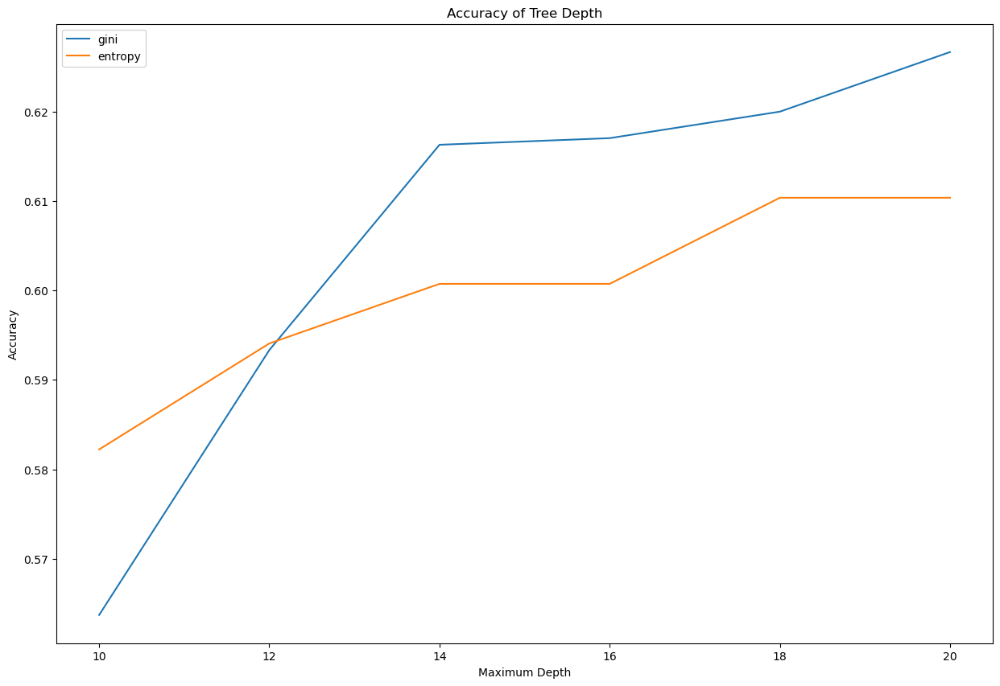

In [ ]:
depths= [10, 12, 14, 16, 18, 20]
chart_depths(depths, X_train_a, y_train_a, X_test_a, y_test_a, 'Accuracy of Tree Depth')


## 2.2 Using Pipelines

In [ ]:
from sklearn.pipeline import Pipeline
from scipy.stats import randint
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

dt_pipe = Pipeline(steps=[('dt', DecisionTreeClassifier(random_state=42))])
dt_params_grid = {
    'dt__criterion': ["gini", "entropy"],
    # 'dt__max_depth': [10, 15, 20],
    # 'dt__max_features': [1, 2, 3, 4, 5, 5, 6, 7, 8, 9, 10],
    # 'dt__min_samples_leaf': [1, 2, 3, 4, 5, 5, 6, 7, 8, 9, 10]
}

rf_pipe = Pipeline(steps=[('rf', RandomForestClassifier(random_state=42))])
rf_params_grid = {
    # 'rf__min_samples_leaf': [1, 2, 3],
    # 'rf__max_depth': [10],
    # 'rf__min_samples_split': [2, 3],
}


# 2.2.1 GridSearchCV

In [ ]:
def run_pipeline(pipeline, params):
    search = GridSearchCV(estimator=pipeline, param_grid=params, scoring='accuracy', cv=10)
    search.fit(X_train_a, y_train_a)
    search.score(X_train_a, y_train_a)
    print("Best params found : ", search.best_params_)
    print("Score : ", search.score(X_test_a, y_test_a)) 
    return search

dt_search = run_pipeline(dt_pipe, dt_params_grid)
rf_search = run_pipeline(rf_pipe, rf_params_grid)
grids = [dt_search, rf_search]

Best params found :  {'dt__criterion': 'entropy'}
Score :  0.6103703703703703
Best params found :  {'rf__max_depth': 3}
Score :  0.45925925925925926


# 2.2.2 RandomizedSearchCV

In [ ]:
from scipy.stats import uniform

param_dist = {"max_depth": [3, 15, 20],
              "max_features": randint(1, 9),
              "min_samples_leaf": randint(1, 9),
              "criterion": ["gini", "entropy"]}

dt_grid_search = RandomizedSearchCV(DecisionTreeClassifier(random_state=42), param_dist)

dt_grid_search.fit(X_train_a, y_train_a)
dt_grid_search.score(X_train_a, y_train_a)
print("Best params found : ", dt_grid_search.best_params_)
print("Score : ", dt_grid_search.score(X_test_a, y_test_a))

Best params found :  {'criterion': 'entropy', 'max_depth': 20, 'max_features': 8, 'min_samples_leaf': 1}
Score :  0.5488888888888889


# 3. Cross Validation & Train-Test Splits

<BarContainer object of 4 artists>

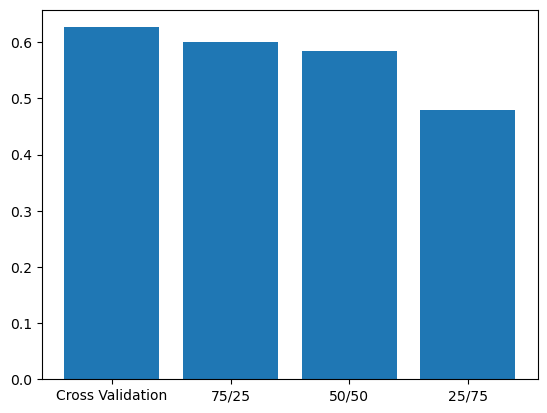

In [ ]:
criterion = 'entropy'
max_depth = 14

tree_model = DecisionTreeClassifier(max_depth=max_depth, criterion=criterion, random_state=42)

# use whole dataset for cross validation
scores = [cross_val_score(tree_model, X, Y, cv=10).mean()]

# Compute the accuracy for each dataset splits
x_tests = [X_test_a, X_test_b, X_test_c]
x_trains = [X_train_a, X_train_b, X_train_c]
y_tests = [y_test_a, y_test_b, y_test_c]
y_trains = [y_train_a, y_train_b, y_train_c]

for x_test, y_test, x_train, y_train in zip (x_tests, y_tests, x_trains, y_trains):
    prediction = test_tree(max_depth, x_train, y_train, x_test, criterion)
    scores.append(len(np.where(prediction==y_test)[0]) / len(prediction))

labels = ['Cross Validation', '75/25', '50/50', '25/75']

plt.bar(labels, scores)


# 4. Sklearn Tree visualisation

[Text(0.595855448440208, 0.9666666666666667, 'X[0] <= 0.831\nentropy = 3.167\nsamples = 1350\nvalue = [170, 151, 158, 142, 144, 137, 150, 155, 143]'),
 Text(0.31876895580589254, 0.9, 'X[2] <= 2.63\nentropy = 2.858\nsamples = 703\nvalue = [110, 6, 129, 93, 4, 66, 99, 79, 117]'),
 Text(0.17458297227036396, 0.8333333333333334, 'X[36] <= -1.274\nentropy = 2.88\nsamples = 514\nvalue = [99, 6, 68, 64, 4, 61, 89, 70, 53]'),
 Text(0.0379477180820335, 0.7666666666666667, 'X[4] <= -4.073\nentropy = 2.456\nsamples = 136\nvalue = [42, 2, 6, 17, 1, 7, 3, 43, 15]'),
 Text(0.00924321201617562, 0.7, 'X[44] <= 0.267\nentropy = 1.578\nsamples = 20\nvalue = [0, 1, 0, 7, 0, 0, 0, 2, 10]'),
 Text(0.00462160600808781, 0.6333333333333333, 'X[29] <= -1.215\nentropy = 0.469\nsamples = 10\nvalue = [0, 1, 0, 0, 0, 0, 0, 0, 9]'),
 Text(0.002310803004043905, 0.5666666666666667, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0, 0, 0, 0, 0, 0]'),
 Text(0.006932409012131715, 0.5666666666666667, 'entropy = 0.0\nsample

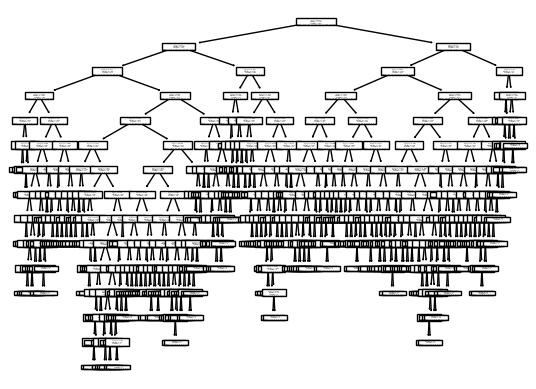

In [ ]:
from sklearn import tree

tree_model.fit(X_test_a, y_test_a)
tree.plot_tree(tree_model)

In [ ]:
from dtreeviz.trees import dtreeviz

viz = dtreeviz(tree_model, X_test_a, y_test_a)
viz

# 5. Metrics

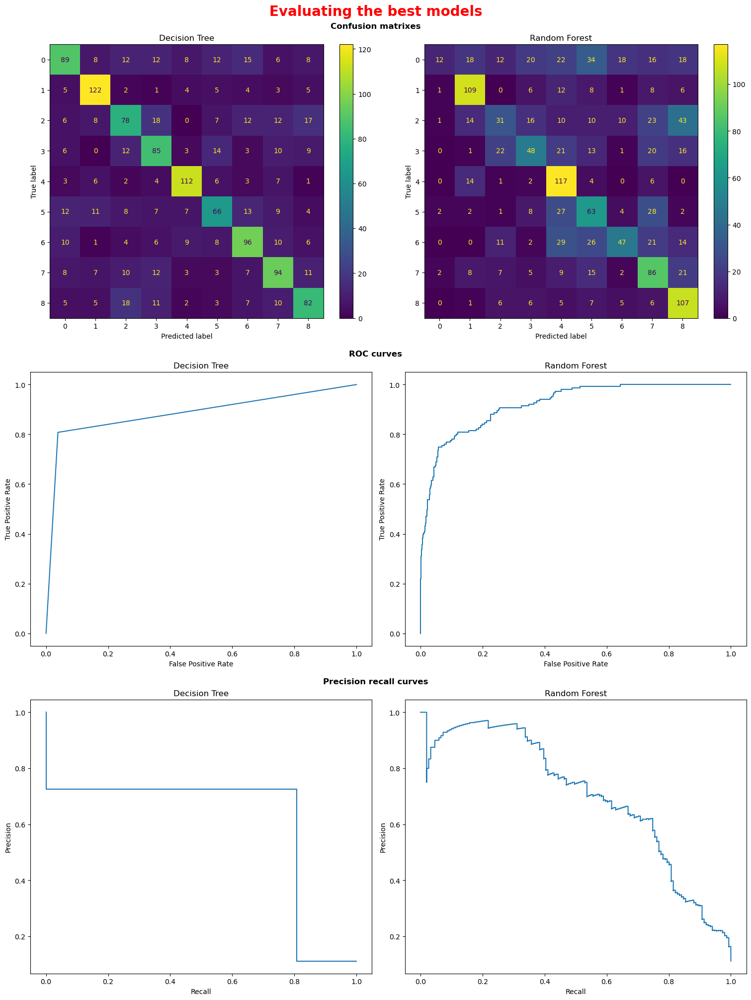

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay

model_names = ["Decision Tree", "Random Forest"]
model_list = [(dt_params_grid, dt_grid_search, "Decision Tree"), (rf_params_grid, rf_search, "Random Forest")]
grid_tuples = []
for grid in grids:
    grid_tuples.append((grid, grid.predict(X_test_a), grid.predict_proba(X_test_a)))


def plot_confusion_matrixes(axs, grid_tuples):
    for i, grid_tuple in enumerate(grid_tuples):
        cm = confusion_matrix(y_test_a, grid_tuple[1])
        cm_display = ConfusionMatrixDisplay(cm)
        cm_display.plot(ax=axs[i]) 
        cm_display.ax_.set_title(model_names[grids.index(grid_tuple[0])])

def plot_roc_curves(axs, grid_tuples):
    for i, grid_tuple in enumerate(grid_tuples):
        fpr, tpr, thresholds = roc_curve(y_test_a, grid_tuple[2][:, 1], pos_label=1)
        roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr)
        roc_display.plot(ax=axs[i]) 
        roc_display.ax_.set_title(model_names[grids.index(grid_tuple[0])])

def plot_precision_recall_curves(axs, grid_tuples):
    for i, grid_tuple in enumerate(grid_tuples):
        prec, recall, thresholds = precision_recall_curve(y_test_a, grid_tuple[2][:, 1], pos_label=1)
        pr_display = PrecisionRecallDisplay(precision=prec, recall=recall)
        pr_display.plot(ax=axs[i]) 
        pr_display.ax_.set_title(model_names[grids.index(grid_tuple[0])])


subfigures_titles = ['Confusion matrixes', 'ROC curves', 'Precision recall curves']
subplot_funcs = [plot_confusion_matrixes, plot_roc_curves, plot_precision_recall_curves]


fig = plt.figure(constrained_layout=True, figsize=(15, 20))
fig.suptitle('Evaluating the best models', fontweight='bold', size=20, color='red')

# create 3x1 subfigs
subfigs = fig.subfigures(nrows=3, ncols=1)
for row, subfig in enumerate(subfigs):
    subfig.suptitle(subfigures_titles[row], fontweight='semibold')

    # create 1x2 subplots per subfig
    axs = subfig.subplots(nrows=1, ncols=2)
    subplot_funcs[row](axs, grid_tuples)